---
title: "Otsu's Threshold Algorithm"
author: "Devansh Lodha"
date: "2024-12-02"
description: "We'll binarize images of Tom and Jerry, Pink Panther and some book pages. Then, we'll challenge Otsu's method with noisy inputs."
categories: [code, probability theory, image processing]
image: "image.png"
jupyter: python3
format: html
---

The Otsu method is used to find the threshold value for a grayscale image. The threshold value is used to separate the image into two parts: the background and the foreground. The Otsu method is based on the assumption that the image has two classes of pixels: the background and the foreground. The method calculates the threshold value that minimizes the intra-class variance and maximizes the inter-class variance. The threshold value is used to separate the image into two parts: the background and the foreground. The Otsu method is widely used in image processing and computer vision applications.

In [100]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
 

In [101]:
bookpage_1 = cv2.imread("bookpage_1.jpeg",0)
bookpage_2 = cv2.imread("bookpage_2.jpeg",0)
panther = cv2.imread("panther.jpeg",0)
tom = cv2.imread("tom.jpeg",0)

## Creating the Histogram of an Image

We have a discrete grayscale image $\{x\}$ with $n_i$ as the number of occurences of gray level $i$. The probability of occurence of a pixel of level $i$ in the image is $$p_x(i)=p(x=i)=\frac{n_i}{n}, \qquad 0\leq i < L$$
where $L$ is the total number of grey levels in the image (here $L=256$), $n$ is the total number of pixels in the image, and $p_x(i)$ is the image's histogram for pixel value $i$ normalized to $[0,1]$

In [102]:
def imgToHist(img):
  hist_data = np.zeros((256))
  # counting number of pixels with a particular value between 0-255
  for x_pixel in range(img.shape[0]):
          for y_pixel in range(img.shape[1]):
              pixel_value = int(img[x_pixel, y_pixel])
              hist_data[pixel_value] += 1

  # normalizing
  hist_data/=(img.shape[0]*img.shape[1])

  # returning the hist
  return hist_data

## Implementing Otsu's Algorithm

The algorithm exhaustively searches for the threshold that minimizes the intra-class variance, defined as a weighted sum of variances of the two classes:
$$\sigma_w^2 (t) = w_0(t)\sigma_0^2 (t)+w_1(t)\sigma_1^2 (t)$$
Weights $w_0$ and $w_1$ are the probabilities of the two classes separated by a threshold $t$, and $\sigma_0^2$ and $\sigma_1^2$ are variance of these two classes.
The class probability $w_{\{0,1\}}(t)$ is computed from the $L$ bins of the histogram:
$$w_0(t) = \sum\limits_{i=0}^{t-1}p(i)$$
$$w_1(t) = \sum\limits_{i=t}^{L-1}p(i)$$
For two classes, minimized the intra-class variance is equivalent to maximizing inter-class variance:
$$\sigma_b^2(t) = \sigma^2 -\sigma_w^2(t) = w_0(t)(\mu_0-\mu_T)^2 + w_1(t)(\mu_1-\mu_T)^2 = w_0(t)w_1(t)[\mu_0(t)-\mu_1(t)]^2$$
which is expressed in terms of class probabilities $w$ and class means $\mu$ where the class means $\mu_0(t)$, $\mu_1(t), \mu_T$ are:
$$\mu_0(t) = \frac{\sum\limits_{i=0}^{t-1}ip(i)}{w_0(t)}$$
$$\mu_1(t) = \frac{\sum\limits_{i=t}^{L-1}ip(i)}{w_1(t)}$$
$$\mu_T = \sum\limits_{i=0}^{L-1}ip(i)$$

#### Algorithm
1. Compute histogram and probabilites of each intensity level
2. Set up initial w_i(0) and u_i(0)
3. Step through all possible thresholds $t=1,...,\text{maximum intensity}$
  1. Update $w_i$ and $\mu_i$
  2. Compute $\sigma_b^2(t)$
4. Desired threshold corresponds to maximum $\sigma_b^2(t)$

In [103]:
def otsu(img):
  hist = imgToHist(img)
  inter_class_variances = []
  for i in range(256):
    w0 = sum(hist[0:i])
    w1 = sum(hist[i:])
    u0 = sum([x*hist[x]/w0 for x in range(0,i)])
    u1 = sum([x*hist[x]/w1 for x in range(i,256)])
    sigma0 = sum([((x-u0)**2)*hist[x] for x in range(0,i)])
    sigma1 = sum([((x-u1)**2)*hist[x] for x in range(i,256)])
    sigmaw = w0*sigma0 + w1*sigma1
    sigmab=w0*w1*(u0-u1)**2
    inter_class_variances.append(sigmab)
  # maximizing inter-class variance
  threshold = inter_class_variances.index(max(inter_class_variances))
  binarized_image = np.zeros_like(img)
  for x_pixel in range(img.shape[0]):
          for y_pixel in range(img.shape[1]):
              pixel_value = int(img[x_pixel, y_pixel])
              if pixel_value > threshold:
                binarized_image[x_pixel, y_pixel] = 255
              else:
                binarized_image[x_pixel, y_pixel] = 0
  return threshold, binarized_image

## Binarizing Images and Plotting Them

In [104]:
def showBinarizedImg(source_img):
    fig, axes = plt.subplots(1, 2, figsize=(6, 4))
    # source image
    axes[0].imshow(source_img, cmap='gray')
    axes[0].set_title(r'Source Image')
    axes[0].axis('off')
    
    # binarized image
    threshold, binarized_img = otsu(source_img)
    axes[1].imshow(binarized_img, cmap='gray')
    axes[1].set_title(r"Binarized Image")
    axes[1].axis('off')

    # figure title based on threshold with LaTeX formatting
    fig.suptitle(fr"Otsu's Threshold: ${threshold}$", fontsize=12)

    plt.tight_layout()
    plt.show()

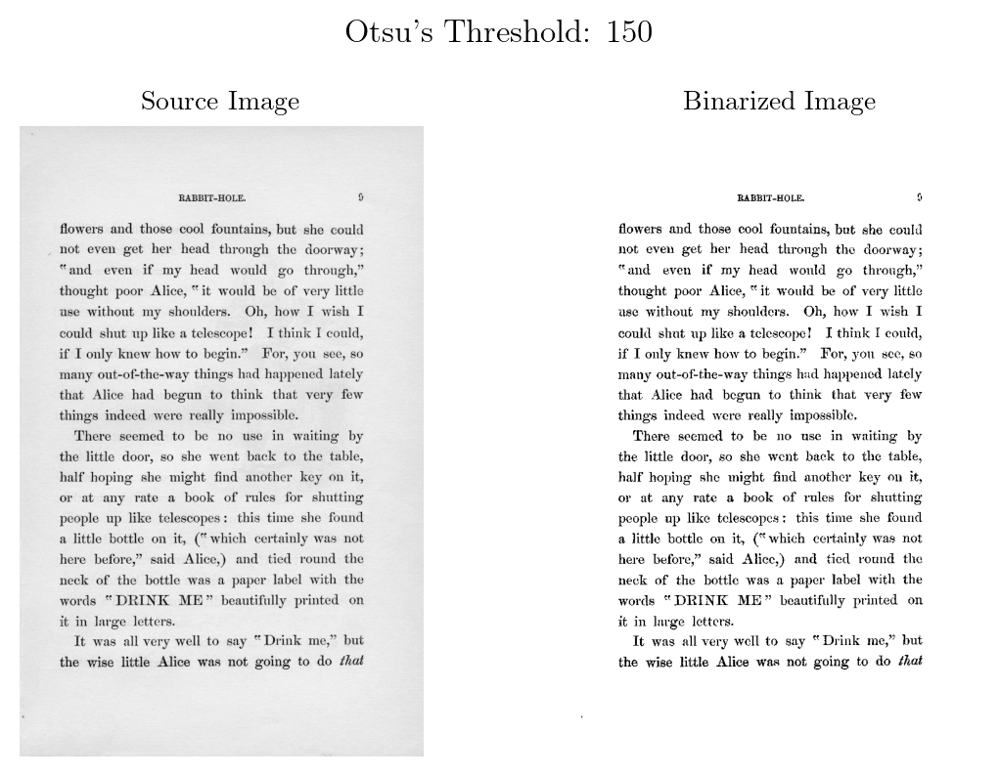

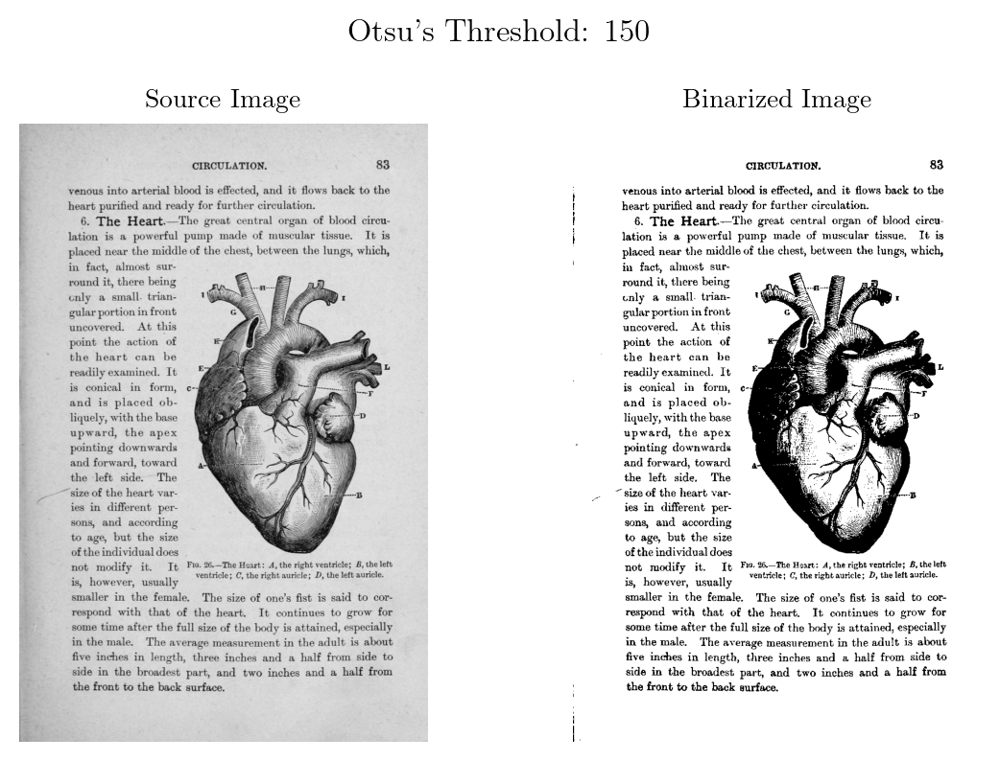

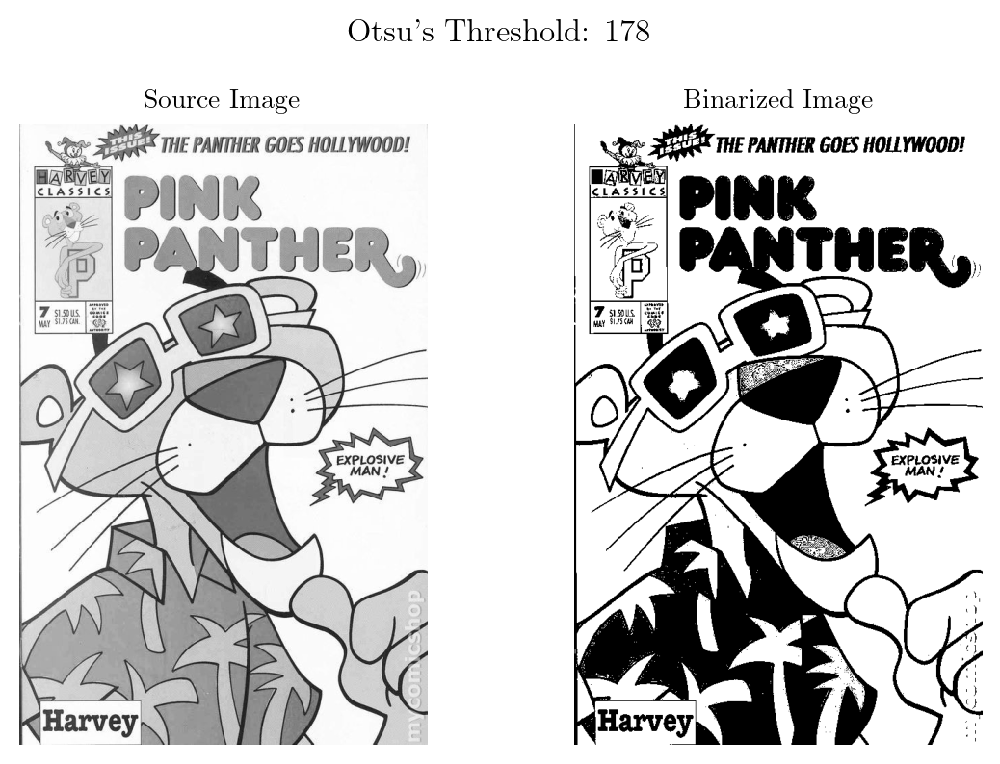

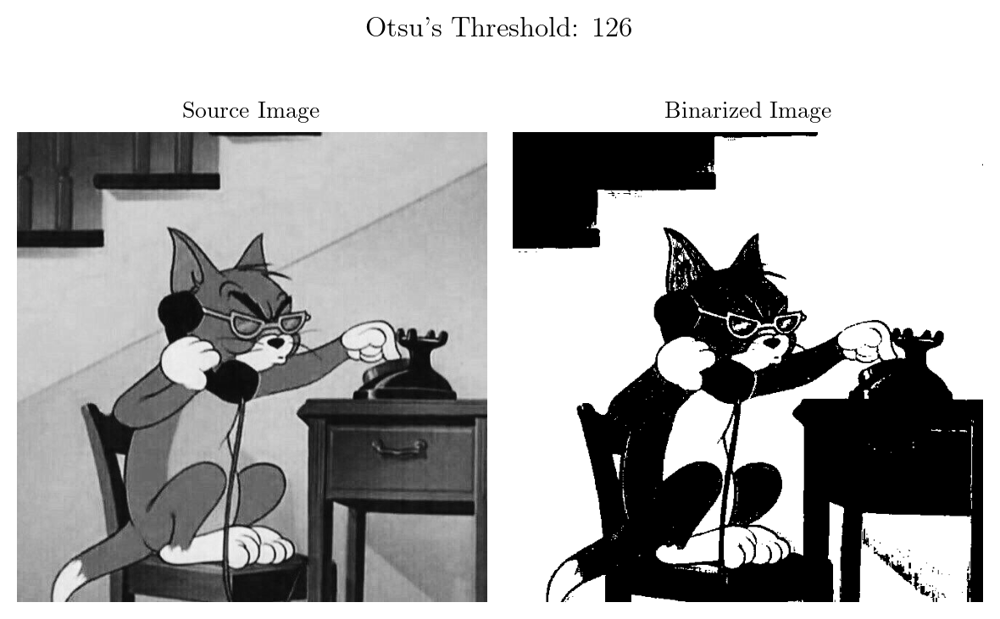

In [105]:
showBinarizedImg(bookpage_1)
showBinarizedImg(bookpage_2)
showBinarizedImg(panther)
showBinarizedImg(tom)

## Adding Gaussian Noise and Applying Otsu's Algorithm

By adding noise to an image, we can simulate real-world scenarios where images are often corrupted by various noise sources (e.g., sensor noise, transmission errors). This allows us to evaluate how well Otsu's method performs under different noise conditions and its robustness to noise.

In [106]:
def addGaussianNoise(img, variance):
  mean = 0.0
  std = np.sqrt(variance)
  noisy_img = img + np.random.normal(mean, std, img.shape)
  noisy_img_clipped = np.clip(noisy_img, 0, 255 )
  return noisy_img_clipped

In [113]:
def showBinarizedImgWithNoise(source_img, variance):
    threshold, binarized_img = otsu(source_img)
    noisy_source_img = addGaussianNoise(source_img, variance)
    noisy_threshold, binarized_noisy_img = otsu(noisy_source_img)
    
    fig, axes = plt.subplots(1, 4, figsize=(12, 4))

    # Source and Binarized Image Titles (without noise)
    source_title = r"Source Image"
    binary_title = fr"Binarized Image (Threshold: ${threshold}$)"

    # Noisy Source and Binarized Image Titles (with noise)
    noisy_source_title = fr"Source Image with Noise ($\sigma^2={variance}$)"
    noisy_binary_title = fr"Binarized Image (Threshold: ${noisy_threshold}$)"

    # Source image
    axes[0].imshow(source_img, cmap='gray')
    axes[0].set_title(source_title)
    axes[0].axis('off')

    # Binarized image
    axes[1].imshow(binarized_img, cmap='gray')
    axes[1].set_title(binary_title)
    axes[1].axis('off')

    # Source image with noise
    axes[2].imshow(noisy_source_img, cmap='gray')
    axes[2].set_title(noisy_source_title)
    axes[2].axis('off')

    # Binarized image with noise
    axes[3].imshow(binarized_noisy_img, cmap='gray')
    axes[3].set_title(noisy_binary_title)
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

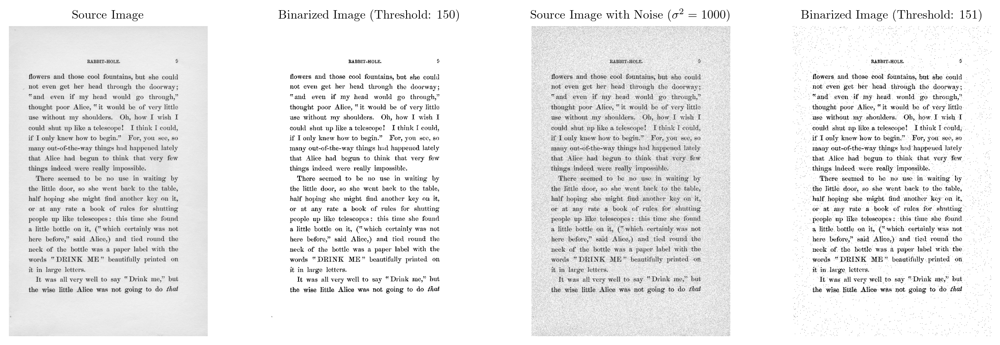

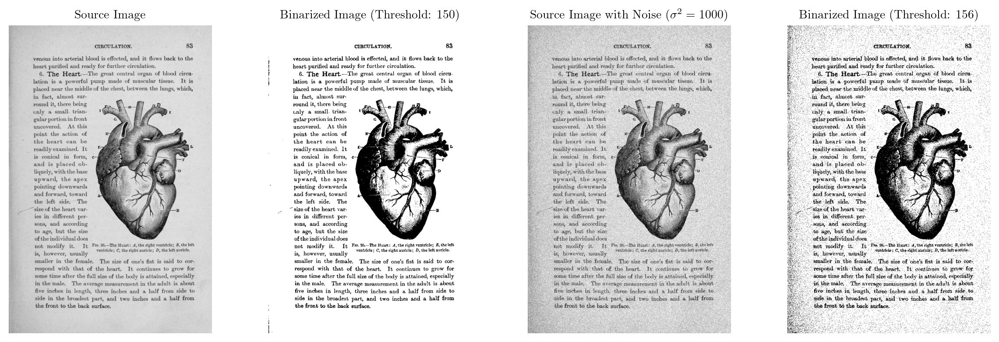

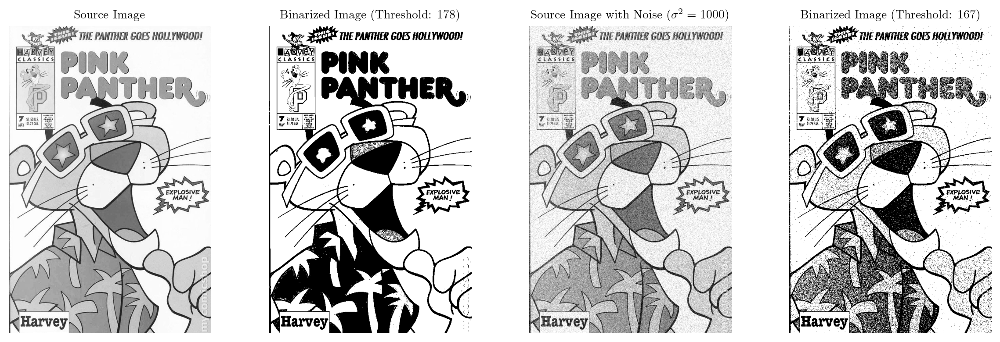

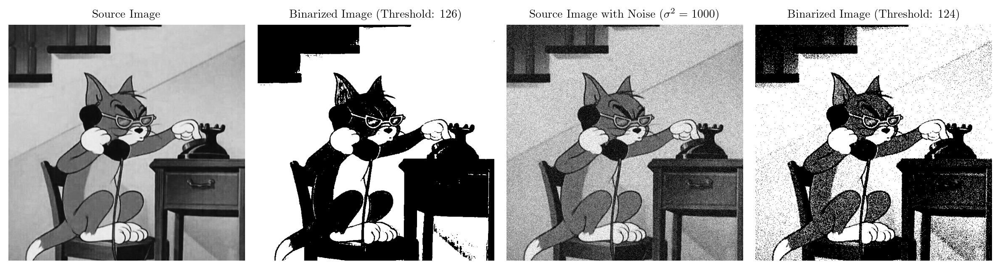

In [114]:
var = 1000
showBinarizedImgWithNoise(bookpage_1, var)
showBinarizedImgWithNoise(bookpage_2, var)
showBinarizedImgWithNoise(panther, var)
showBinarizedImgWithNoise(tom, var)

The threshold value obtained from Otsu's method may vary significantly depending on the noise level. Higher noise levels can lead to less accurate thresholding.

The quality of the binarized image can degrade with increasing noise. Noisy pixels can be incorrectly classified as foreground or background, leading to a loss of detail and accuracy.

By analyzing the results under different noise levels, we can assess the robustness of Otsu's method. Some variations of Otsu's method, such as adaptive thresholding, may be more resilient to noise.

We might consider pre-processing techniques like noise reduction filters to improve the input image quality before applying Otsu's method.

## References
Wikipedia Contributors, “Otsu's method,” Wikipedia, Aug. 16, 2020. [https://en.wikipedia.org/wiki/Otsu%27s_method](https://en.wikipedia.org/wiki/Otsu%27s_method)

In [5]:
intervals = [(1,4), (4, 7)]
i = 0
while i!=len(intervals)-1:
    if intervals[i][1] > intervals[i+1][0]:
        intervals = intervals[:i]+[(intervals[i][0], intervals[i+1][1])]+intervals[i+2:]
    else:
        i+=1
intervals

[(1, 4), (4, 7)]